In [ ]:
import sys
import os
os.environ['OPENAI_API_KEY'] = # your api-key here or get it from your environment
import pandas as pd
import numpy as np
from ast import literal_eval

from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import classification_report, accuracy_score
from embeddings_utils import get_embedding
from scipy.stats import uniform, randint


from lightgbm import LGBMClassifier

import pickle

import matplotlib.pyplot as plt

# Add the src directory to the system path
src_path = os.path.abspath(os.path.join('..', 'src'))
if src_path not in sys.path:
    sys.path.append(src_path)

models_path = os.path.abspath(os.path.join('..', 'models'))

pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', 500)

# Import and merge data

In [ ]:
# Load it
df_train_test = pd.read_parquet('../data/interim/train_test.parquet')
df_train_test['final_classification_str3'] = df_train_test['final_classification_str4'].str[:3]
df_train_test

In [ ]:
df_train_test['final_classification_str3'].nunique()

# Get embeddings

In [ ]:
embedding_model = "text-embedding-3-large"
embedding_encoding = "cl100k_base"
max_tokens = 8000  # the maximum for text-embedding-3-small is 8191

In [ ]:
# Quick test before full load

df_train_test_sample = df_train_test.head(10)

df_train_test_sample['role_embedding'] = df_train_test_sample['role_english'].fillna('empty').apply(lambda x: get_embedding(x, model=embedding_model))
df_train_test_sample['description_embedding'] = df_train_test_sample['description_english'].fillna('empty').apply(lambda x: get_embedding(x, model=embedding_model))

df_train_test_sample.head(3)

In [ ]:
# FULL LOAD

df_train_test['role_embedding'] = df_train_test['role_english'].fillna('empty').apply(lambda x: get_embedding(x, model=embedding_model))
df_train_test['description_embedding'] = df_train_test['description_english'].fillna('empty').apply(lambda x: get_embedding(x, model=embedding_model))

df_train_test.head(3)

In [ ]:
df_train_test.to_parquet('../data/processed/train_test_embedded.parquet')

# Train model

In [2]:
df_train_test_embedded = pd.read_parquet('../data/processed/train_test_embedded.parquet')
df_train_test_embedded.head()

,person_id,role_english,description_english,final_classification_str2,final_classification_str4,role_embedding,description_embedding,start_date,end_date,final_classification_str3,final_classification_str1,final_classification_str5,final_classification_str6
0,2,CX Operations Analyst,Creation and adjustment of processes and tools...,13,1311,"[-0.021468602120876312, -0.0379633903503418, -...","[-0.02547643706202507, -0.015847422182559967, ...",2023-02,Ongoing,131,1,13116,131161
1,2,Digital Commerce Specialist Program,Customer Experience Operations:- Customer Serv...,13,1311,"[-0.0316968597471714, 0.001369012868963182, -0...","[-0.02761560119688511, -0.02133786864578724, -...",2021-07,2023-01,131,1,13116,131161
2,2,Sales Administration Intern,- Validation of documents to certify the eligi...,41,4190,"[-0.01025207806378603, -0.000775732274632901, ...","[-0.020034700632095337, 0.023991981521248817, ...",2019-05,2021-05,419,4,41909,419099
3,3,Junior researcher,None,04,0400,"[-0.016745729371905327, -0.010879790410399437,...","[-0.00958956591784954, -0.025797028094530106, ...",2022-07,Ongoing,040,0,04000,040000
4,7,Risk Internship,- Data analysis for Market and Liquidity Risk ...,13,1320,"[-0.026051711291074753, -0.003746205475181341,...","[-0.04262274503707886, -0.026540184393525124, ...",None,Ongoing,132,1,13209,132099


In [3]:
# removing unidentified jobs
df_train_test_embedded = df_train_test_embedded[df_train_test_embedded['final_classification_str3'] != '090']
df_train_test_embedded.head()

,person_id,role_english,description_english,final_classification_str2,final_classification_str4,role_embedding,description_embedding,start_date,end_date,final_classification_str3,final_classification_str1,final_classification_str5,final_classification_str6
0,2,CX Operations Analyst,Creation and adjustment of processes and tools...,13,1311,"[-0.021468602120876312, -0.0379633903503418, -...","[-0.02547643706202507, -0.015847422182559967, ...",2023-02,Ongoing,131,1,13116,131161
1,2,Digital Commerce Specialist Program,Customer Experience Operations:- Customer Serv...,13,1311,"[-0.0316968597471714, 0.001369012868963182, -0...","[-0.02761560119688511, -0.02133786864578724, -...",2021-07,2023-01,131,1,13116,131161
2,2,Sales Administration Intern,- Validation of documents to certify the eligi...,41,4190,"[-0.01025207806378603, -0.000775732274632901, ...","[-0.020034700632095337, 0.023991981521248817, ...",2019-05,2021-05,419,4,41909,419099
3,3,Junior researcher,None,04,0400,"[-0.016745729371905327, -0.010879790410399437,...","[-0.00958956591784954, -0.025797028094530106, ...",2022-07,Ongoing,040,0,04000,040000
4,7,Risk Internship,- Data analysis for Market and Liquidity Risk ...,13,1320,"[-0.026051711291074753, -0.003746205475181341,...","[-0.04262274503707886, -0.026540184393525124, ...",None,Ongoing,132,1,13209,132099


In [4]:
df_train_test_embedded.shape

(3296, 13)

In [5]:
df_train_test_embedded['final_classification_str6'].nunique()

137

In [6]:
# # creating previous and next jobs columns (just shifting for the same person_id)
# # df_train_test_embedded['previous_role_embedding'] = df_train_test_embedded.groupby('person_id')['role_embedding'].shift(-1)
# # df_train_test_embedded['previous_description_embedding'] = df_train_test_embedded.groupby('person_id')['description_embedding'].shift(-1)
# df_train_test_embedded['previous_final_classification_str2'] = df_train_test_embedded.groupby('person_id')['final_classification_str2'].shift(-1)


# # df_train_test_embedded['next_role_embedding'] = df_train_test_embedded.groupby('person_id')['role_embedding'].shift(1)
# # df_train_test_embedded['next_description_embedding'] = df_train_test_embedded.groupby('person_id')['description_embedding'].shift(1)
# df_train_test_embedded['next_final_classification_str2'] = df_train_test_embedded.groupby('person_id')['final_classification_str2'].shift(1)

In [7]:
# df_train_test_embedded

## Using PCA on the embeddings

In [8]:
# Flatten the array embeddings and concatenate with the integer feature
arr1s = np.vstack(df_train_test_embedded['role_embedding'].values)  # Shape: (n_samples, embedding_size)
arr2s = np.vstack(df_train_test_embedded['description_embedding'].values)  # Shape: (n_samples, embedding_size)

# Concatenate all features horizontally
X = np.hstack((arr1s, arr2s))  # Shape: (n_samples, 2*embedding_size)
y = df_train_test_embedded['final_classification_str6'].values  # Shape: (n_samples,)

del df_train_test_embedded

In [9]:
# Ensure that X is a 2D array and y is a 1D array
print("Shape of X:", X.shape)
print("Shape of y:", y.shape)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

role_embedding_matrix = X_train[:, 0:3072]
description_embedding_matrix = X_train[:, 3072:]

Shape of X: (3296, 6144)
Shape of y: (3296,)


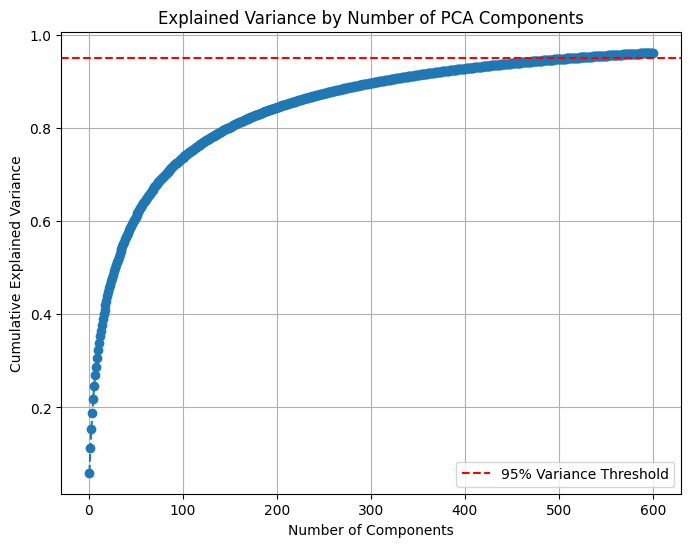

Number of components to retain 90.0% variance: 308
Number of components to retain 95.0% variance: 511
Number of components to retain 99.0% variance: 1


In [10]:
max_dimensions = 600  # Adjust based on the size of your data
pca = PCA(n_components=max_dimensions, random_state=42)

# Fit PCA on the combined embedding matrix
pca.fit(role_embedding_matrix)

# Calculate cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)


# Plot the explained variance for the elbow method
plt.figure(figsize=(8, 6))
plt.plot(range(1, max_dimensions + 1), cumulative_variance, marker='o', linestyle='--')
plt.title("Explained Variance by Number of PCA Components")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.grid(True)
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Variance Threshold')
plt.legend()
plt.show()

# Print dimensions needed for key thresholds
thresholds = [0.90, 0.95, 0.99]
for threshold in thresholds:
    n_components = np.argmax(cumulative_variance >= threshold) + 1
    print(f"Number of components to retain {threshold*100}% variance: {n_components}")

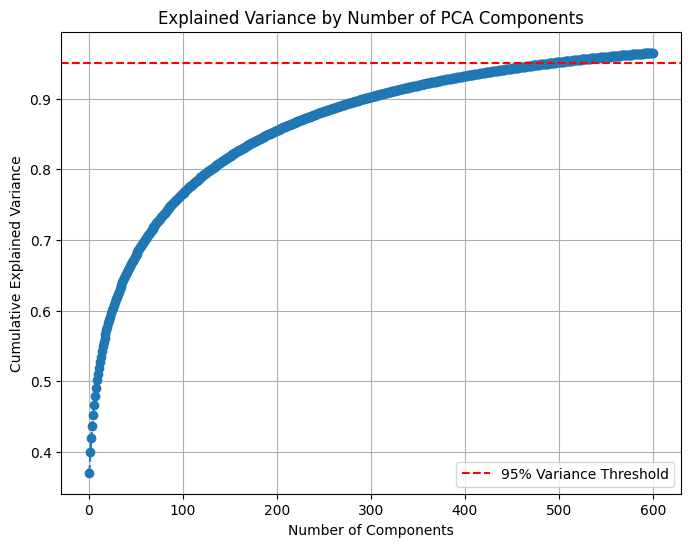

Number of components to retain 90.0% variance: 294
Number of components to retain 95.0% variance: 490
Number of components to retain 99.0% variance: 1


In [11]:
# Define a range of PCA dimensions to evaluate
max_dimensions = 600  # Adjust based on the size of your data
pca = PCA(n_components=max_dimensions, random_state=42)

# Fit PCA on the combined embedding matrix
pca.fit(description_embedding_matrix)

# Calculate cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)


# Plot the explained variance for the elbow method
plt.figure(figsize=(8, 6))
plt.plot(range(1, max_dimensions + 1), cumulative_variance, marker='o', linestyle='--')
plt.title("Explained Variance by Number of PCA Components")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.grid(True)
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Variance Threshold')
plt.legend()
plt.show()

# Print dimensions needed for key thresholds
thresholds = [0.90, 0.95, 0.99]
for threshold in thresholds:
    n_components = np.argmax(cumulative_variance >= threshold) + 1
    print(f"Number of components to retain {threshold*100}% variance: {n_components}")

In [13]:
# Check shape
print("Original shape of X_train:", X_train.shape)  # (n_samples, 1536)


pca_dim = 600 # elbow method
pca_role = PCA(n_components=pca_dim, random_state=42)
pca_description = PCA(n_components=pca_dim, random_state=42)
reduced_role_embedding = pca_role.fit_transform(role_embedding_matrix)
reduced_description_embedding = pca_description.fit_transform(description_embedding_matrix)

X_train_reduced = np.hstack((reduced_role_embedding, reduced_description_embedding))

print("Reduced shape of X_train:", X_train_reduced.shape)  # (n_samples, pca_dim)

Original shape of X_train: (2636, 6144)
Reduced shape of X_train: (2636, 1200)


### Model to classify based solely on current role_embedding and description_embedding

In [12]:
print("X_train_reduced shape:", X_train_reduced.shape)  # (n_samples, 2*pca_dim)
print("y_train shape:", y_train.shape)  # (n_samples, 1)

X_train_reduced shape: (2636, 1200)
y_train shape: (2636,)


In [19]:
# LightGBM parameters
lgbm_params = {
    'learning_rate': uniform(0.01, 0.1),
    'n_estimators': randint(50, 200),
    'max_depth': randint(3, 7),
    'num_leaves': randint(20, 100),
    'min_child_samples': randint(10, 30),
}

# Random Forest parameters
rf_params = {
    'n_estimators': randint(50, 200),
    'max_depth': randint(3, 15),
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 10),
}

# SVM parameters
svm_params = {
    'C': uniform(0.1, 10),
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
    'gamma': ['scale', 'auto'],
    'degree': randint(2, 5),  # Only used for 'poly' kernel
}

# Initialize the classifiers
lgbm = LGBMClassifier(random_state=42)
rf = RandomForestClassifier(random_state=42)
svm = SVC(probability=True, random_state=42)

# Perform RandomizedSearchCV for each model

# LightGBM
lgbm_search = RandomizedSearchCV(
    estimator=lgbm,
    param_distributions=lgbm_params,
    scoring='f1_weighted',
    n_iter=3,
    cv=3,
    verbose=0,
    n_jobs=1,
    random_state=42
)
lgbm_search.fit(X_train_reduced, y_train)

# Random Forest
rf_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=rf_params,
    scoring='f1_weighted',
    n_iter=3,
    cv=3,
    verbose=0,
    n_jobs=1,
    random_state=42
)
rf_search.fit(X_train_reduced, y_train)

# SVM
svm_search = RandomizedSearchCV(
    estimator=svm,
    param_distributions=svm_params,
    scoring='f1_weighted',
    n_iter=3,
    cv=3,
    verbose=0,
    n_jobs=1,
    random_state=42
)
svm_search.fit(X_train_reduced, y_train)

/home/andrejpadilha/Mestrado/final_analysis/career_trajectory_ufabc/venv_career_trajectory_ufabc/lib/python3.10/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=3.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 305999
[LightGBM] [Info] Number of data points in the train set: 1757, number of used features: 1200
[LightGBM] [Info] Start training from score -1.922287
[LightGBM] [Info] Start training from score -6.778216
[LightGBM] [Info] Start training from score -3.377019
[LightGBM] [Info] Start training from score -4.005627
[LightGBM] [Info] Start training from score -5.861925
[LightGBM] [Info] Start training from score -5.679604
[LightGBM] [Info] Start training from score -5.525453
[LightGBM] [Info] Start training from score -5.861925
[LightGBM] [Info] Start training from score -4.832306
[LightGBM] [Info] Start training from score -4.580991
[LightGBM] [Info] Start training from score -4.335869
[LightGBM] [Info] Start training from score -7.471363
[LightGBM] [Info] Start training from score -6.778216
[Light

/home/andrejpadilha/Mestrado/final_analysis/career_trajectory_ufabc/venv_career_trajectory_ufabc/lib/python3.10/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=3.
  warnings.warn(
/home/andrejpadilha/Mestrado/final_analysis/career_trajectory_ufabc/venv_career_trajectory_ufabc/lib/python3.10/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=3.
  warnings.warn(


RandomizedSearchCV(cv=3, estimator=SVC(probability=True, random_state=42),
                   n_iter=3, n_jobs=1,
                   param_distributions={'C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7f6389ede920>,
                                        'degree': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7f6389de3d60>,
                                        'gamma': ['scale', 'auto'],
                                        'kernel': ['linear', 'rbf', 'poly',
                                                   'sigmoid']},
                   random_state=42, scoring='f1_weighted')

In [27]:
# Print the best parameters and score
print("Best Hyperparameters LGBM:", lgbm_search.best_params_)
print("Best CV Score LGBM:", lgbm_search.best_score_)

print("\nBest Hyperparameters RF:", rf_search.best_params_)
print("Best CV Score LGBM:", rf_search.best_score_)

print("\nBest Hyperparameters SVM:", svm_search.best_params_)
print("Best CV Score SVM:", svm_search.best_score_)

# Train the best model on the entire training set
best_lgbm = lgbm_search.best_estimator_
best_rf = rf_search.best_estimator_
best_svm = svm_search.best_estimator_

Best Hyperparameters LGBM: {'learning_rate': np.float64(0.06986584841970366), 'max_depth': 5, 'min_child_samples': 28, 'n_estimators': 124, 'num_leaves': 94}
Best CV Score LGBM: 0.5745707344994844

Best Hyperparameters RF: {'max_depth': 13, 'min_samples_leaf': 8, 'min_samples_split': 6, 'n_estimators': 70}
Best CV Score LGBM: 0.39920522080712084

Best Hyperparameters SVM: {'C': np.float64(7.896910002727692), 'degree': 2, 'gamma': 'scale', 'kernel': 'rbf'}
Best CV Score SVM: 0.6276870231753405


In [21]:
role_embedding_matrix = X_test[:, 0:3072]
description_embedding_matrix = X_test[:, 3072:]
reduced_role_embedding = pca_role.transform(role_embedding_matrix)
reduced_description_embedding = pca_description.transform(description_embedding_matrix)
X_test_reduced = np.hstack((reduced_role_embedding, reduced_description_embedding))

In [22]:
preds_lgbm = best_lgbm.predict(X_test_reduced)
probas_lgbm = best_lgbm.predict_proba(X_test_reduced)

report_lgbm = classification_report(y_test, preds_lgbm)
print(report_lgbm)

              precision    recall  f1-score   support

      000000       0.57      0.93      0.70        96
      030000       0.94      0.76      0.84        21
      040000       0.83      0.62      0.71        16
      050000       0.00      0.00      0.00         1
      060000       0.00      0.00      0.00         1
      112021       1.00      0.33      0.50         3
      112022       0.00      0.00      0.00         3
      113021       0.50      1.00      0.67         2
      113031       0.00      0.00      0.00         1
      113071       1.00      0.42      0.59        12
      119021       0.00      0.00      0.00         1
      119051       1.00      1.00      1.00         1
      119151       1.00      1.00      1.00         1
      131023       0.73      0.89      0.80         9
      131041       1.00      0.50      0.67         6
      131071       1.00      0.67      0.80         6
      131081       0.00      0.00      0.00         2
      131082       1.00    

/home/andrejpadilha/Mestrado/final_analysis/career_trajectory_ufabc/venv_career_trajectory_ufabc/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/andrejpadilha/Mestrado/final_analysis/career_trajectory_ufabc/venv_career_trajectory_ufabc/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/andrejpadilha/Mestrado/final_analysis/career_trajectory_ufabc/venv_career_trajectory_ufabc/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision i

In [25]:
preds_rf = best_rf.predict(X_test_reduced)
probas_rf = best_rf.predict_proba(X_test_reduced)

report_rf = classification_report(y_test, preds_rf)
print(report_rf)

              precision    recall  f1-score   support

      000000       0.32      0.95      0.48        96
      030000       0.93      0.62      0.74        21
      040000       1.00      0.38      0.55        16
      050000       0.00      0.00      0.00         1
      060000       0.00      0.00      0.00         1
      112021       0.00      0.00      0.00         3
      112022       0.00      0.00      0.00         3
      113021       1.00      0.50      0.67         2
      113031       0.00      0.00      0.00         1
      113071       1.00      0.17      0.29        12
      119021       0.00      0.00      0.00         1
      119051       0.00      0.00      0.00         1
      119151       0.00      0.00      0.00         1
      131023       0.55      0.67      0.60         9
      131041       1.00      0.17      0.29         6
      131071       1.00      0.17      0.29         6
      131081       0.00      0.00      0.00         2
      131082       0.00    

/home/andrejpadilha/Mestrado/final_analysis/career_trajectory_ufabc/venv_career_trajectory_ufabc/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/andrejpadilha/Mestrado/final_analysis/career_trajectory_ufabc/venv_career_trajectory_ufabc/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/andrejpadilha/Mestrado/final_analysis/career_trajectory_ufabc/venv_career_trajectory_ufabc/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Pre

In [26]:
preds_svm = best_svm.predict(X_test_reduced)
probas_svm = best_svm.predict_proba(X_test_reduced)

report_svm = classification_report(y_test, preds_svm)
print(report_svm)

              precision    recall  f1-score   support

      000000       0.65      0.89      0.75        96
      030000       0.85      0.81      0.83        21
      040000       0.77      0.62      0.69        16
      050000       0.00      0.00      0.00         1
      060000       0.00      0.00      0.00         1
      112021       0.00      0.00      0.00         3
      112022       0.00      0.00      0.00         3
      113021       0.67      1.00      0.80         2
      113031       0.00      0.00      0.00         1
      113071       1.00      0.33      0.50        12
      119021       0.00      0.00      0.00         1
      119051       0.00      0.00      0.00         1
      119151       1.00      1.00      1.00         1
      131023       0.73      0.89      0.80         9
      131041       1.00      0.67      0.80         6
      131071       1.00      0.83      0.91         6
      131081       0.00      0.00      0.00         2
      131082       1.00    

/home/andrejpadilha/Mestrado/final_analysis/career_trajectory_ufabc/venv_career_trajectory_ufabc/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/andrejpadilha/Mestrado/final_analysis/career_trajectory_ufabc/venv_career_trajectory_ufabc/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/andrejpadilha/Mestrado/final_analysis/career_trajectory_ufabc/venv_career_trajectory_ufabc/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision i

### SVM was the best, so we will now expand the hyperparameter search

In [14]:
svm = SVC(probability=True, random_state=42)

# SVM parameters
expanded_svm_params = {
    'C': uniform(0.01, 20),  # Expanding the range for regularization parameter
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
    'gamma': ['scale', 'auto', uniform(0.001, 1)],  # Adding finer control for gamma
    'degree': randint(2, 6),  # For 'poly' kernel, extended range
    'coef0': uniform(0, 5),  # For 'poly' and 'sigmoid' kernels, controlling shape
}

# SVM
expanded_svm_search = RandomizedSearchCV(
    estimator=svm,
    param_distributions=expanded_svm_params,
    scoring='f1_weighted',
    n_iter=5,  # Increase the number of sampled configurations
    cv=3,  # Increased cross-validation folds for better evaluation
    verbose=1,
    n_jobs=1,
    random_state=42
)
expanded_svm_search.fit(X_train_reduced, y_train)

Fitting 3 folds for each of 5 candidates, totalling 15 fits


/home/andrejpadilha/Mestrado/final_analysis/career_trajectory_ufabc/venv_career_trajectory_ufabc/lib/python3.10/site-packages/sklearn/model_selection/_split.py:776: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=3.
  warnings.warn(
/home/andrejpadilha/Mestrado/final_analysis/career_trajectory_ufabc/venv_career_trajectory_ufabc/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
3 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "/home/andrejpadilha/Mestrado/final_analysis/career_trajectory_ufabc/venv_career_trajectory_ufabc/lib/python3.10/si

RandomizedSearchCV(cv=3, estimator=SVC(probability=True, random_state=42),
                   n_iter=5, n_jobs=1,
                   param_distributions={'C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7f00f97e25f0>,
                                        'coef0': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7f00f9816110>,
                                        'degree': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7f010d05fca0>,
                                        'gamma': ['scale', 'auto',
                                                  <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7f00f98f1c90>],
                                        'kernel': ['linear', 'rbf', 'poly',
                                                   'sigmoid']},
                   random_state=42, scoring='f1_weighted', verbose=1)

In [18]:
print("\nBest Hyperparameters SVM:", expanded_svm_search.best_params_)
print("Best CV Score SVM:", expanded_svm_search.best_score_)

# Train the best model on the entire training set
best_svm = expanded_svm_search.best_estimator_


Best Hyperparameters SVM: {'C': np.float64(7.50080237694725), 'coef0': np.float64(4.75357153204958), 'degree': 4, 'gamma': 'scale', 'kernel': 'linear'}
Best CV Score SVM: 0.6676500930005492


In [16]:
role_embedding_matrix = X_test[:, 0:3072]
description_embedding_matrix = X_test[:, 3072:]
reduced_role_embedding = pca_role.transform(role_embedding_matrix)
reduced_description_embedding = pca_description.transform(description_embedding_matrix)
X_test_reduced = np.hstack((reduced_role_embedding, reduced_description_embedding))

preds_svm = best_svm.predict(X_test_reduced)
probas_svm = best_svm.predict_proba(X_test_reduced)

report_svm = classification_report(y_test, preds_svm)
print(report_svm)

              precision    recall  f1-score   support

      000000       0.68      0.89      0.77        96
      030000       0.85      0.81      0.83        21
      040000       0.80      0.75      0.77        16
      050000       1.00      1.00      1.00         1
      060000       0.00      0.00      0.00         1
      112021       0.00      0.00      0.00         3
      112022       0.00      0.00      0.00         3
      113021       0.33      1.00      0.50         2
      113031       0.00      0.00      0.00         1
      113071       1.00      0.33      0.50        12
      119021       0.00      0.00      0.00         1
      119051       1.00      1.00      1.00         1
      119151       0.50      1.00      0.67         1
      131023       0.67      0.89      0.76         9
      131041       1.00      0.83      0.91         6
      131071       0.86      1.00      0.92         6
      131081       1.00      0.50      0.67         2
      131082       1.00    

/home/andrejpadilha/Mestrado/final_analysis/career_trajectory_ufabc/venv_career_trajectory_ufabc/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/andrejpadilha/Mestrado/final_analysis/career_trajectory_ufabc/venv_career_trajectory_ufabc/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/andrejpadilha/Mestrado/final_analysis/career_trajectory_ufabc/venv_career_trajectory_ufabc/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision i

In [17]:
# saving this model
with open(os.path.join(models_path, 'pca_role.pkl'), 'wb') as file:
    pickle.dump(pca_role, file)
with open(os.path.join(models_path, 'pca_description.pkl'), 'wb') as file:
    pickle.dump(pca_description, file)


with open(os.path.join(models_path, 'svm_only_t0_info.pkl'), 'wb') as file:
    pickle.dump(best_svm, file)